In [1]:
import importlib
import io
import matplotlib.pyplot as plt
import numpy as np
import os
import openslide
from openslide import open_slide
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops, ImageDraw, ImageStat
import SimpleITK as sitk
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_holes
import staintools
from staintools.stain_extraction.macenko_stain_extractor import MacenkoStainExtractor
from staintools.stain_extraction.vahadane_stain_extractor import VahadaneStainExtractor
from staintools.miscellaneous.optical_density_conversion import convert_OD_to_RGB
from staintools.miscellaneous.get_concentrations import get_concentrations
import cv2 as cv
from staintools.preprocessing.input_validation import is_uint8_image
import sys

Image.MAX_IMAGE_PIXELS = None

In [2]:
# Import HEMnet package
BASE_DIR = Path().resolve().parent
HEMNET_DIR = BASE_DIR.joinpath('HEMnet')
sys.path.append(str(HEMNET_DIR))

from slide import *
from utils import *
from normaliser import IterativeNormaliser

In [3]:
import utils
importlib.reload(utils)
from utils import *

import normaliser
importlib.reload(normaliser)
from normaliser import IterativeNormaliser

In [147]:
# User Input parameters
SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/test')
#SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005')
OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/25_06_20_testing')
#OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/train_dataset_tp53_testrun')
TEMPLATE_SLIDE_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/1957_T_9668_3_HandE.svs')
ORIENTATION_CORRECTIONS_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/test/test_orientation_corrections.csv')

ALIGNMENT_MAG = 2
TILE_MAG = 10
VERBOSE = True
CANCER_THRESH = 0.39
NON_CANCER_THRESH = 0.40
#Allow user to select between 'none', 'reinhard', 'macenko' and 'vahadane'
NORMALISER_METHOD = "vahadane"
STANDARDISE_LUMINOSITY = True

#Verbose functions
if VERBOSE:
    verbose_print = lambda *args: print(*args)
    verbose_save_img = lambda img, path, img_type: img.save(path, img_type)
    verbose_save_fig = lambda fig, path, dpi=300: fig.savefig(path, dpi=dpi)
else:
    verbose_print = lambda *args: None
    verbose_save_img = lambda *args: None
    verbose_save_fig = lambda *args: None

# Find Slides
slides = []
for slide in SLIDES_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()
slides

['1792_T_9500_2_TP53.svs',
 '1792_T_9500_3_HandE.svs',
 '1798_T_9514_2_TP53.svs',
 '1798_T_9514_3_HandE.svs',
 '1919_T_10779_2_TP53.svs',
 '1919_T_10779_3_HandE.svs',
 '1932_T_9876_2_TP53.svs',
 '1932_T_9876_3_HandE.svs',
 '1939_T_9661_2_TP53.svs',
 '1939_T_9661_3_HandE.svs',
 '2011_T_9699_2_TP53.svs',
 '2011_T_9699_3_HandE.svs',
 '2019_T_9717_2_TP53.svs',
 '2019_T_9717_3_HandE.svs',
 '2023_T_9727_2_TP53.svs',
 '2023_T_9727_3_HandE.svs',
 '2036_T_9729_2_TP53.svs',
 '2036_T_9729_3_HandE.svs',
 '2038_T_11986_2_TP53.svs',
 '2038_T_11986_3_HandE.svs',
 '2075_T_9787_2_TP53.svs',
 '2075_T_9787_3_HandE.svs',
 '2090_T_10594_2_TP53.svs',
 '2090_T_10594_3_HandE.svs',
 '232_T_13230_2_TP53.svs',
 '232_T_13230_3_HandE.svs',
 '2382_T_15360_2_TP53.svs',
 '2382_T_15360_3_HandE.svs',
 '526_T_15907_2_TP53.svs',
 '526_T_15907_3_HandE.svs',
 '526_T_15915_2_TP53.svs',
 '526_T_15915_3_HandE.svs',
 '526_T_15923_2_TP53.svs',
 '526_T_15923_3_HandE.svs']

In [148]:
orientation_corrections = pd.read_csv(ORIENTATION_CORRECTIONS_PATH, index_col = 0, header = None)

In [139]:
orientation_corrections

,1
0,
1792_T_9500_2_TP53.svs,0
1798_T_9514_2_TP53.svs,0
1919_T_10779_2_TP53.svs,0
1932_T_9876_2_TP53.svs,0
1939_T_9661_2_TP53.svs,0
2011_T_9699_2_TP53.svs,0
2019_T_9717_2_TP53.svs,0
2023_T_9727_2_TP53.svs,0
2036_T_9729_2_TP53.svs,0


In [5]:
tile_counts_df = pd.DataFrame([])

In [6]:
TP53_slides = [slide for slide in slides if 'TP53' in slide]
HE_slides = [slide for slide in slides if 'HandE' in slide]
Paired_slides = list(zip(TP53_slides, HE_slides))
print('Found {0} pairs of slides'.format(len(Paired_slides)))
for i, pair in enumerate(Paired_slides):
    tp53, he = pair
    verbose_print('{0}. {1}|{2}'.format(i + 1, tp53, he))

Found 17 pairs of slides
1. 1792_T_9500_2_TP53.svs|1792_T_9500_3_HandE.svs
2. 1798_T_9514_2_TP53.svs|1798_T_9514_3_HandE.svs
3. 1919_T_10779_2_TP53.svs|1919_T_10779_3_HandE.svs
4. 1932_T_9876_2_TP53.svs|1932_T_9876_3_HandE.svs
5. 1939_T_9661_2_TP53.svs|1939_T_9661_3_HandE.svs
6. 2011_T_9699_2_TP53.svs|2011_T_9699_3_HandE.svs
7. 2019_T_9717_2_TP53.svs|2019_T_9717_3_HandE.svs
8. 2023_T_9727_2_TP53.svs|2023_T_9727_3_HandE.svs
9. 2036_T_9729_2_TP53.svs|2036_T_9729_3_HandE.svs
10. 2038_T_11986_2_TP53.svs|2038_T_11986_3_HandE.svs
11. 2075_T_9787_2_TP53.svs|2075_T_9787_3_HandE.svs
12. 2090_T_10594_2_TP53.svs|2090_T_10594_3_HandE.svs
13. 232_T_13230_2_TP53.svs|232_T_13230_3_HandE.svs
14. 2382_T_15360_2_TP53.svs|2382_T_15360_3_HandE.svs
15. 526_T_15907_2_TP53.svs|526_T_15907_3_HandE.svs
16. 526_T_15915_2_TP53.svs|526_T_15915_3_HandE.svs
17. 526_T_15923_2_TP53.svs|526_T_15923_3_HandE.svs


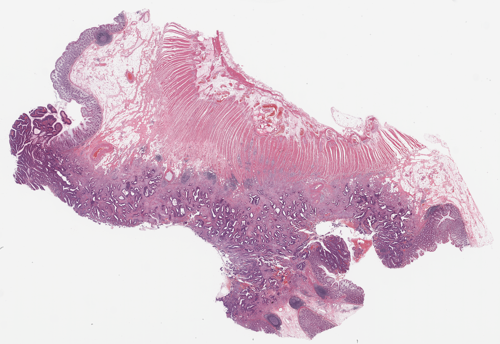

In [7]:
template_slide = open_slide(str(TEMPLATE_SLIDE_PATH))
template_img = read_slide_at_mag(template_slide, ALIGNMENT_MAG).convert('RGB')

thumbnail(template_img, (500,500))

In [8]:
# Fit template slide
normaliser = IterativeNormaliser(NORMALISER_METHOD, STANDARDISE_LUMINOSITY)
normaliser.fit_target(template_img)

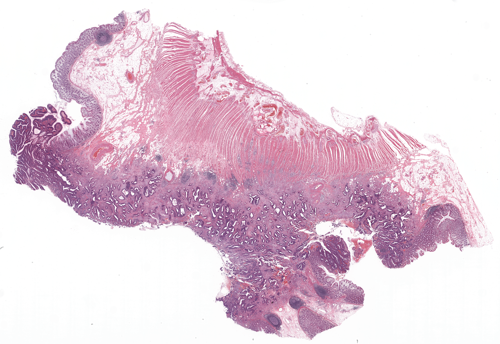

In [9]:
thumbnail(Image.fromarray(normaliser.target_std), (500,500))

In [116]:
SLIDE_NUM = 16
PREFIX = Paired_slides[SLIDE_NUM][0][:-8]
verbose_print('Processing Slide: {0}'.format(PREFIX))
tp53_name, he_name = Paired_slides[SLIDE_NUM]
tp53_slide = open_slide(str(SLIDES_PATH.joinpath(tp53_name)))
he_slide = open_slide(str(SLIDES_PATH.joinpath(he_name)))

Processing Slide: 526_T_15923_2_


In [118]:
#Load Slides
he = read_slide_at_mag(he_slide, ALIGNMENT_MAG)
tp53 = read_slide_at_mag(tp53_slide, ALIGNMENT_MAG)

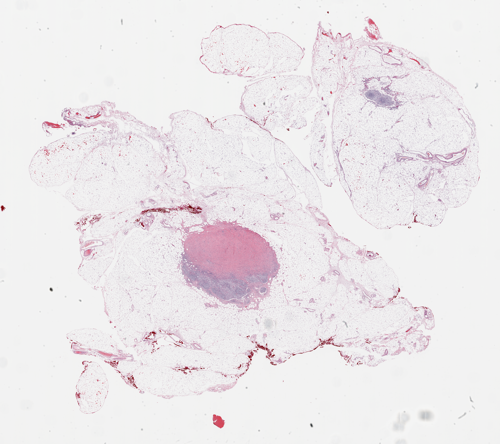

In [119]:
thumbnail(he, (500, 500))

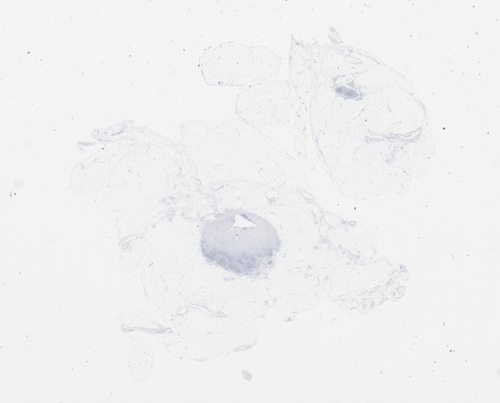

In [120]:
thumbnail(tp53, (500, 500))

In [114]:
#Normalise H&E Slide
normaliser.fit_source(he)
he_norm = normaliser.transform_tile(he)

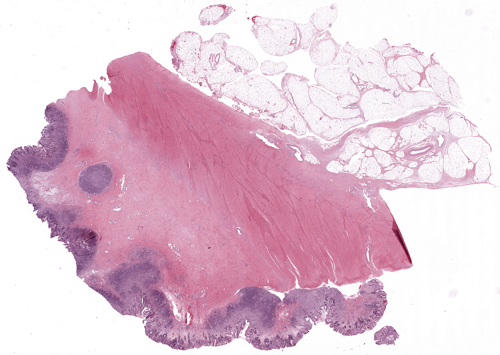

In [115]:
thumbnail(he_norm, (500, 500))

In [103]:
######################
# Image Registration #
######################

INTERPOLATOR = sitk.sitkLanczosWindowedSinc

#Convert to grayscale
tp53_gray = tp53.convert('L')
he_gray = he_norm.convert('L')
#Convert to ITK format
tp53_itk = get_itk_from_pil(tp53_gray)
he_itk = get_itk_from_pil(he_gray)
#Set fixed and moving images
fixed_img = he_itk
moving_img = tp53_itk

In [104]:
# Check initial registration
# Centre the two images, then compare their alignment
initial_transform = sitk.CenteredTransformInitializer(fixed_img, moving_img, sitk.Euler2DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.GEOMETRY)
moving_rgb = sitk_transform_rgb(tp53, he_norm, initial_transform)
# comparison_pre = show_alignment(he_norm_small, moving_rgb, prefilter = True)
# verbose_save_img(comparison_pre.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_pre_registration.jpeg'), 'JPEG' )

In [101]:
#Visualise and save alignment
align_plotter = PlotImageAlignment('vertical', 300)
comparison_pre_v_stripes = align_plotter.plot_images(he, moving_rgb)
verbose_save_img(comparison_pre_v_stripes.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_pre_align_v_stripes.jpeg'), 'JPEG' )

align_plotter = PlotImageAlignment('horizontal', 300)
comparison_pre_h_stripes = align_plotter.plot_images(he, moving_rgb)
verbose_save_img(comparison_pre_h_stripes.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_pre_align_h_stripes.jpeg'), 'JPEG' )

align_plotter = PlotImageAlignment('mosaic', 300)
comparison_pre_mosaic = align_plotter.plot_images(he, moving_rgb)
verbose_save_img(comparison_pre_mosaic.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_pre_align_mosaic.jpeg'), 'JPEG' )

comparison_pre_colour_overlay = show_alignment(he_norm, moving_rgb, prefilter = True)
verbose_save_img(comparison_pre_colour_overlay.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_pre_align_colour_overlay.jpeg'), 'JPEG' )

In [102]:
def correlation(img1, img2):
    """Pearson's Correlation Coefficient between two grayscale PIL images of the same size
    """
    img1_float, img2_float = np.float32(np.array(img1)), np.float32(np.array(img2))
    mean1, sd1 = ImageStat.Stat(img1).mean[0], ImageStat.Stat(img1).stddev[0]
    mean2, sd2 = ImageStat.Stat(img2).mean[0], ImageStat.Stat(img2).stddev[0]
    n_pixels = ImageStat.Stat(tp53_gray).count[0]
    covariance = (img1_float.ravel() - mean1).dot((img2_float.ravel() - mean2))/n_pixels
    return covariance/(sd1 * sd2)

In [127]:
def optimal_angle(tp53, he):
    """Determines the optimal angle (0, 90, 180 or 270) to rotate the TP53 image
    
    Use before registration. 
    
    Parameters
    ----------
    tp53 : Pillow image (RGB)
    he : Pillow image (RGB)
    
    Returns
    -------
    angle : int
    """
    #Convert to grayscale
    tp53_gray = tp53.convert('L')
    he_gray = he.convert('L')
    #Find optimal angle
    angles = [0, 90, 180, 270]
    mutual_infos = []
    for angle in angles:
        tp53_rotated = tp53_gray.rotate(angle)
        tp53_rotated_itk = get_itk_from_pil(tp53_rotated)
        he_gray_itk = get_itk_from_pil(he_gray)
        fixed_img = he_gray_itk
        
        moving_img = tp53_rotated_itk
        #Align the two images at the center and transform the TP53 image
        initial_transform = sitk.CenteredTransformInitializer(moving_img, fixed_img, sitk.Euler2DTransform(), 
                                                          sitk.CenteredTransformInitializerFilter.GEOMETRY)
        method = sitk.ImageRegistrationMethod()
        # Similarity metric settings.
        method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
        method.SetMetricSamplingStrategy(method.RANDOM)
        method.SetMetricSamplingPercentage(0.15)

        method.SetInterpolator(INTERPOLATOR)

        # Optimizer settings.
        method.SetOptimizerAsGradientDescent(learningRate=1, numberOfIterations=100, convergenceMinimumValue=1e-6, convergenceWindowSize=20)
        method.SetOptimizerScalesFromPhysicalShift()

        # Setup for the multi-resolution framework.            
        method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2])
        method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1])
        method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

        # Don't optimize in-place, we would possibly like to run this cell multiple times.
        method.SetInitialTransform(initial_transform, inPlace=False)

        # Connect all of the observers so that we can perform plotting during registration.
        method.AddCommand(sitk.sitkStartEvent, start_plot)
        method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
        method.AddCommand(sitk.sitkIterationEvent, lambda: update_plot(method))

        transform = method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                                       sitk.Cast(moving_img, sitk.sitkFloat32))

        fig = plot_metric('Plot of mutual information cost in affine registration')
        plt.show()
        #verbose_save_fig(affine_fig, OUTPUT_PATH.joinpath(PREFIX + 'affine_metric_plot.jpeg'))
        end_plot()
        
        tp53_resampled = sitk.Resample(moving_img, fixed_img, transform, 
                                     sitk.sitkLanczosWindowedSinc, 0.0, moving_img.GetPixelID())
        he_gray_array = np.array(get_pil_from_itk(he_gray_itk))
        tp53_resampled_array = np.array(get_pil_from_itk(tp53_resampled))
        #Calculate the mutual info between the transformed TP53 image and original H&E image 
        mi = calculate_mutual_info(he_gray_array, tp53_resampled_array)
        mutual_infos.append(mi)
        print(mutual_infos)
    return angles[np.argmax(mutual_infos)]    #Return the angle corresponding to the max mutual information
    

In [128]:
def optimal_angle2(tp53, he):
    """Determines the optimal angle (0, 90, 180 or 270) to rotate the TP53 image
    
    Use before registration. 
    
    Parameters
    ----------
    tp53 : Pillow image (RGB)
    he : Pillow image (RGB)
    
    Returns
    -------
    angle : int
    """
    #Convert to grayscale
    tp53_gray = tp53.convert('L')
    he_gray = he.convert('L')
    #Find optimal angle
    angles = [0, 90, 180, 270]
    correlations = []
    for angle in angles:
        tp53_rotated = tp53_gray.rotate(angle)
        tp53_rotated_itk = get_itk_from_pil(tp53_rotated)
        he_gray_itk = get_itk_from_pil(he_gray)
        
        fixed_img = he_gray_itk
        moving_img = tp53_rotated_itk
        #Align the two images at the center and transform the TP53 image
        initial_transform = sitk.CenteredTransformInitializer(moving_img, fixed_img, sitk.Euler2DTransform(), 
                                                          sitk.CenteredTransformInitializerFilter.GEOMETRY)
        method = sitk.ImageRegistrationMethod()
        # Similarity metric settings.
        method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
        method.SetMetricSamplingStrategy(method.RANDOM)
        method.SetMetricSamplingPercentage(0.15)

        method.SetInterpolator(INTERPOLATOR)

        # Optimizer settings.
        method.SetOptimizerAsGradientDescent(learningRate=3, numberOfIterations=100, convergenceMinimumValue=1e-6, convergenceWindowSize=20)
        method.SetOptimizerScalesFromPhysicalShift()

        # Setup for the multi-resolution framework.            
        method.SetShrinkFactorsPerLevel(shrinkFactors = [8,4])
        method.SetSmoothingSigmasPerLevel(smoothingSigmas=[4,2])
        method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

        # Don't optimize in-place, we would possibly like to run this cell multiple times.
        method.SetInitialTransform(initial_transform, inPlace=False)

        # Connect all of the observers so that we can perform plotting during registration.
        method.AddCommand(sitk.sitkStartEvent, start_plot)
        method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
        method.AddCommand(sitk.sitkIterationEvent, lambda: update_plot(method))

        transform = method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                                       sitk.Cast(moving_img, sitk.sitkFloat32))

        fig = plot_metric('Plot of mutual information cost in affine registration')
        plt.show()
        #verbose_save_fig(affine_fig, OUTPUT_PATH.joinpath(PREFIX + 'affine_metric_plot.jpeg'))
        end_plot()
        
        tp53_resampled = sitk.Resample(moving_img, fixed_img, transform, 
                                     sitk.sitkLanczosWindowedSinc, 0.0, moving_img.GetPixelID())
        tp53_resampled_pil = get_pil_from_itk(tp53_resampled)
        correlations.append(correlation(he_gray, tp53_resampled_pil))
    print(correlations) 
    return angles[np.argmax(correlations)]    #Return the angle corresponding to the max mutual information

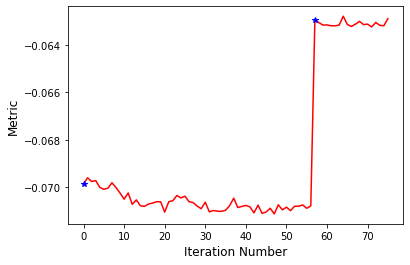

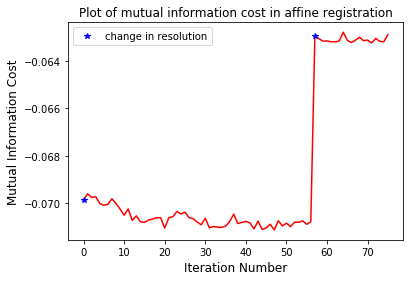

[0.06257658479075424, 0.06312338317550824, 0.09048409801851809, 0.07230016695868553]


In [129]:
#angle = optimal_angle(tp53, he_norm)
#angle = 0

In [146]:
angle = orientation_corrections.loc[tp53_name].values[0]
angle

0

In [106]:
#Convert to grayscale
tp53 = tp53.rotate(angle)
tp53_gray = tp53.convert('L')
he_gray = he_norm.convert('L')
#Convert to ITK format
tp53_itk = get_itk_from_pil(tp53_gray)
he_itk = get_itk_from_pil(he_gray)
#Set fixed and moving images
fixed_img = he_itk
moving_img = tp53_itk

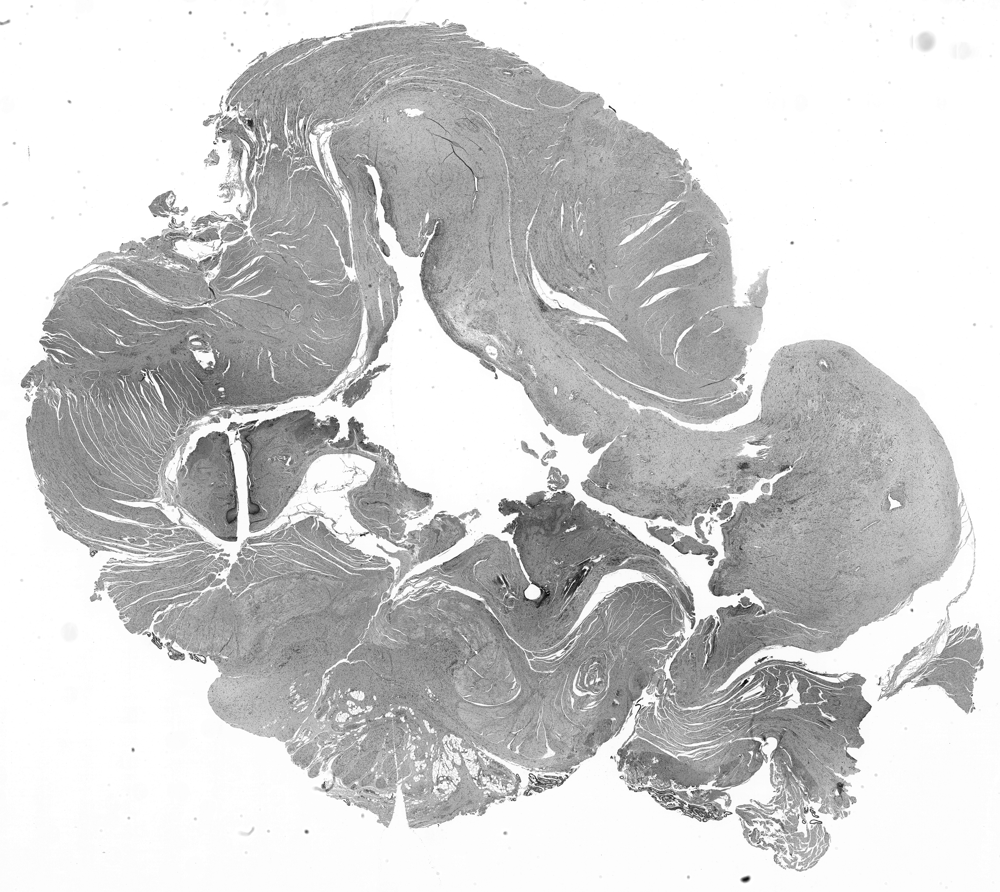

In [107]:
thumbnail(get_pil_from_itk(fixed_img))

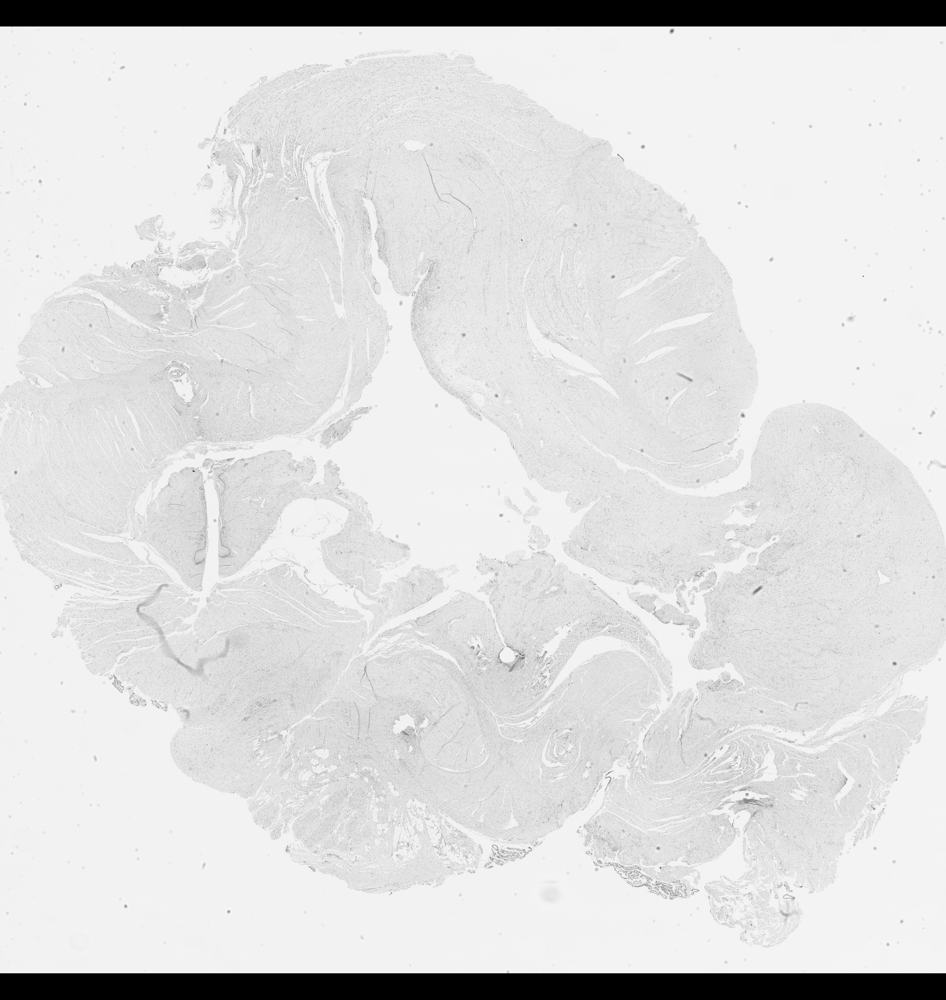

In [108]:
thumbnail(get_pil_from_itk(moving_img))

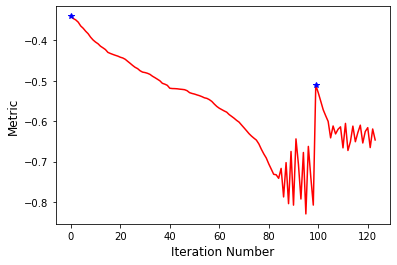

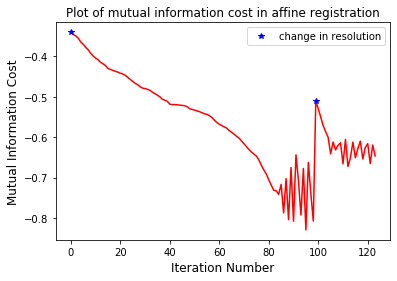

Affine metric value: -0.5884954478375021
Affine Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 25.


In [56]:
#Affine Registration
initial_transform = sitk.CenteredTransformInitializer(fixed_img, moving_img, sitk.Euler2DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.GEOMETRY)
affine_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
affine_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
affine_method.SetMetricSamplingStrategy(affine_method.RANDOM)
affine_method.SetMetricSamplingPercentage(0.15)

affine_method.SetInterpolator(INTERPOLATOR)

# Optimizer settings.
affine_method.SetOptimizerAsGradientDescent(learningRate=1, numberOfIterations=100, convergenceMinimumValue=1e-6, convergenceWindowSize=20)
affine_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
affine_method.SetShrinkFactorsPerLevel(shrinkFactors = [8,4])
affine_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[4,2])
affine_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
affine_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
affine_method.AddCommand(sitk.sitkStartEvent, start_plot)
affine_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
affine_method.AddCommand(sitk.sitkIterationEvent, lambda: update_plot(affine_method))

affine_transform = affine_method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                               sitk.Cast(moving_img, sitk.sitkFloat32))

affine_fig = plot_metric('Plot of mutual information cost in affine registration')
plt.show()
verbose_save_fig(affine_fig, OUTPUT_PATH.joinpath(PREFIX + 'affine_metric_plot.jpeg'))
end_plot()

verbose_print('Affine metric value: {0}'.format(affine_method.GetMetricValue()))
verbose_print('Affine Optimizer\'s stopping condition, {0}'.format(affine_method.GetOptimizerStopConditionDescription()))

In [57]:
#Compute the mutual information between the two images after affine registration
moving_resampled_affine = sitk.Resample(moving_img, fixed_img, affine_transform, 
                                 INTERPOLATOR, 0.0, moving_img.GetPixelID())
affine_mutual_info = calculate_mutual_info(np.array(he_gray), np.array(get_pil_from_itk(moving_resampled_affine)))
verbose_print('Affine mutual information metric: {0}'.format(affine_mutual_info))

Affine mutual information metric: 0.3732235286186632


In [58]:
# thumbnail(get_pil_from_itk(moving_resampled_affine))

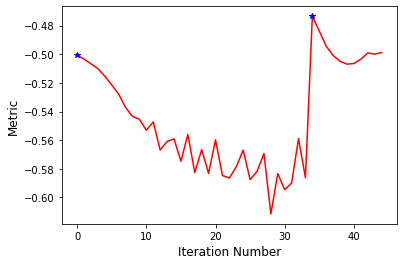

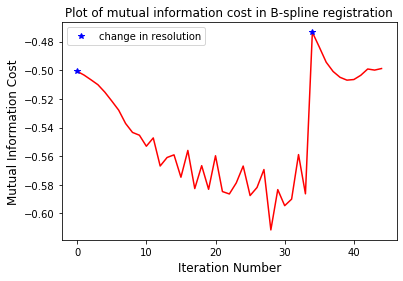

B-spline metric value: -0.5011052195459675
B-spline Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 11.


In [59]:
#B-spline registration
bspline_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
bspline_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
bspline_method.SetMetricSamplingStrategy(bspline_method.RANDOM)
bspline_method.SetMetricSamplingPercentage(0.15)

bspline_method.SetInterpolator(INTERPOLATOR)

# Optimizer settings.
bspline_method.SetOptimizerAsGradientDescent(learningRate=1, numberOfIterations=200, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
bspline_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
bspline_method.SetShrinkFactorsPerLevel(shrinkFactors = [2,1])
bspline_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[1,0])
bspline_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
transformDomainMeshSize = [8]*moving_resampled_affine.GetDimension()
initial_transform = sitk.BSplineTransformInitializer(fixed_img, transformDomainMeshSize)
bspline_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
bspline_method.AddCommand(sitk.sitkStartEvent, start_plot)
bspline_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
bspline_method.AddCommand(sitk.sitkIterationEvent, lambda: update_plot(bspline_method))

bspline_transform = bspline_method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                               sitk.Cast(moving_resampled_affine, sitk.sitkFloat32))

bspline_fig = plot_metric('Plot of mutual information cost in B-spline registration')
plt.show()
verbose_save_fig(bspline_fig, OUTPUT_PATH.joinpath(PREFIX + 'bspline_metric_plot.jpeg'))
end_plot()

verbose_print('B-spline metric value: {0}'.format(bspline_method.GetMetricValue()))
verbose_print('B-spline Optimizer\'s stopping condition, {0}'.format(bspline_method.GetOptimizerStopConditionDescription()))

In [60]:
#Compute the mutual information between the two images after B-spline registration
moving_resampled_final = sitk.Resample(moving_resampled_affine, fixed_img, bspline_transform, 
                                 INTERPOLATOR, 0.0, moving_img.GetPixelID())
bspline_mutual_info = calculate_mutual_info(np.array(he_gray), np.array(get_pil_from_itk(moving_resampled_final)))
verbose_print('B-spline mutual information metric: {0}'.format(bspline_mutual_info))

B-spline mutual information metric: 0.46214771717145575


In [61]:
#Transform the original TP53 into the aligned TP53 image
moving_rgb_affine = sitk_transform_rgb(tp53, he_norm, affine_transform, INTERPOLATOR)
tp53_aligned = sitk_transform_rgb(moving_rgb_affine, he_norm, bspline_transform, INTERPOLATOR)

In [62]:
#Visualise and save alignment
align_plotter = PlotImageAlignment('vertical', 300)
comparison_post_v_stripes = align_plotter.plot_images(he, tp53_aligned)
verbose_save_img(comparison_post_v_stripes.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_post_align_v_stripes.jpeg'), 'JPEG' )

align_plotter = PlotImageAlignment('horizontal', 300)
comparison_post_h_stripes = align_plotter.plot_images(he, tp53_aligned)
verbose_save_img(comparison_post_h_stripes.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_post_align_h_stripes.jpeg'), 'JPEG' )

align_plotter = PlotImageAlignment('mosaic', 300)
comparison_post_mosaic = align_plotter.plot_images(he, tp53_aligned)
verbose_save_img(comparison_post_mosaic.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_post_align_mosaic.jpeg'), 'JPEG' )

In [63]:
#Remove backgrounds from TP53 and H&E images
tp53_filtered = filter_green(tp53_aligned)
he_filtered = filter_green(he_norm)
tp53_filtered = filter_grays(tp53_filtered, tolerance = 2)
he_filtered = filter_grays(he_filtered, tolerance = 15)

#Visually compare alignment between the registered TP53 and original H&E image
comparison_post_colour_overlay = show_alignment(he_filtered, tp53_filtered)
verbose_save_img(comparison_post_colour_overlay.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_post_align_colour_overlay.jpeg'), 'JPEG' )

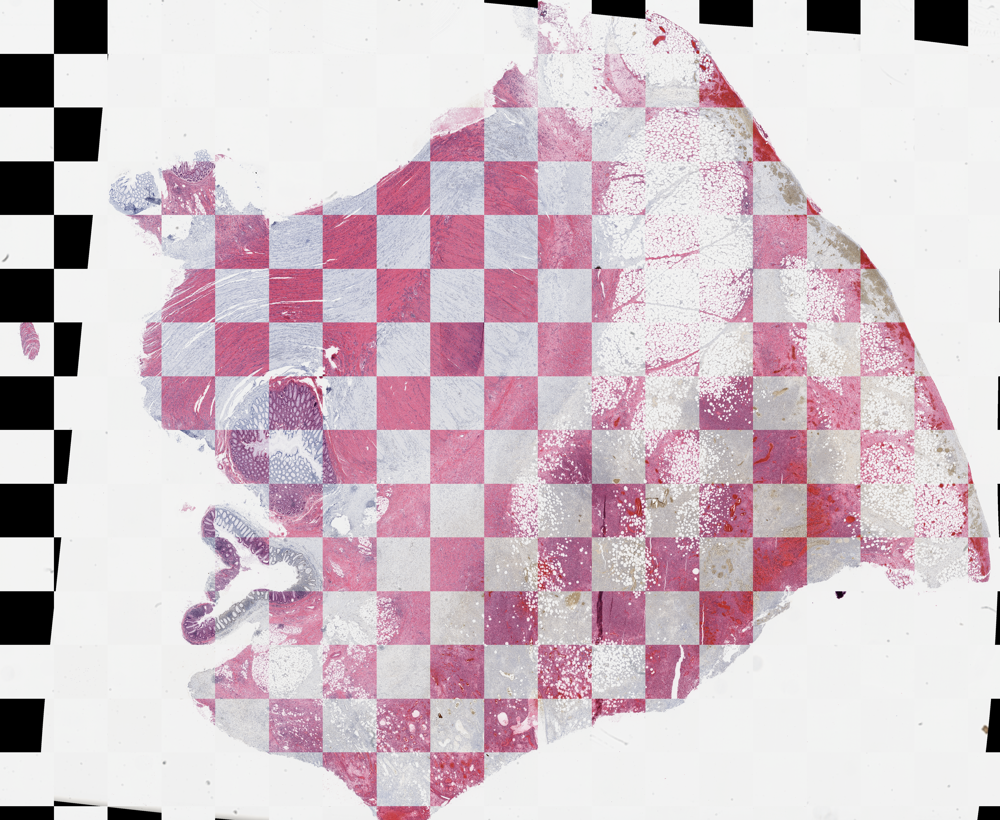

In [64]:
thumbnail(comparison_post_mosaic)

In [65]:
####################################
# Generate cancer and tissue masks #
####################################

# def cancer_mask_v1(img, tile_size, cancer_thresh):
#     #Determine Dab threshold with a smaller 1000x1000 image
#     downsample = max(img.size)/1000
#     img_small_size = tuple([np.int(np.round(dim/downsample)) for dim in img.size])
#     img_small = img.resize(img_small_size, resample = Image.BICUBIC)
#     hed_small = rgb2hed(img_small)
#     dab_thresh = threshold_otsu_masked(hed_small)
#     mask = []
#     tgen = tile_gen(img, tile_size)
#     shape = next(tgen)
#     for tile in tgen:
#         tile = tile.convert('RGB')
#         tile_hed = rgb2hed(tile)
#         tile_dab = -tile_hed[:,:,2]
#         binary_dab = tile_dab > dab_thresh
#         if np.array(binary2gray(binary_dab)).mean() < cancer_thresh:
#             mask.append(0)
#         else:
#             mask.append(1)
#     return np.reshape(mask, shape) 

# def cancer_mask(img, tile_size, cancer_thresh = 250):
#     #Determine Dab threshold with a smaller 1000x1000 image
#     downsample = max(img.size)/1000
#     img_small_size = tuple([np.int(np.round(dim/downsample)) for dim in img.size])
#     img_small = img.resize(img_small_size, resample = Image.BICUBIC)
#     hed_small = rgb2hed(img_small)
#     dab_thresh = threshold_otsu_masked(hed_small)
#     #Extract Dab channel (stain)
#     hed = rgb2hed(img)
#     dab_channel = -hed[:,:,2]
#     dab_binary = dab_channel > dab_thresh
#     #Remove background staining 
#     dab_binary_filtered = remove_small_holes(dab_binary, area_threshold = 64)
#     tgen = tile_gen(binary2gray(dab_binary_filtered), tile_size)
#     c_mask = threshold_mask(tgen, cancer_thresh)
#     return c_mask 

def show_mask(mask):
    mask = mask.astype(np.uint8)
    plt.imshow(np.reshape(mask, mask.shape[::-1]))
    plt.colorbar()

In [66]:
tile_size = 299*ALIGNMENT_MAG/TILE_MAG

In [67]:
#Generate cancer mask and tissue mask from filtered tp53 image
c_mask = cancer_mask(tp53_filtered, tile_size, 250)
t_mask_tp53 = tissue_mask(tp53_filtered, tile_size)
t_mask_he = tissue_mask(he_filtered, tile_size)

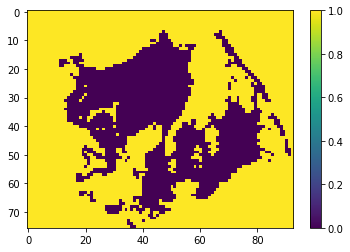

In [68]:
show_mask(t_mask_tp53)

In [69]:
def dab_tile_array(img, tile_size):
    dab_values = []
    tgen = tile_gen(img, tile_size)
    shape = next(tgen)
    for tile in tgen:
        tile = tile.convert('RGB')
        tile_hed = rgb2hed(tile)
        tile_dab = -tile_hed[:,:,2]
        dab_values.append(tile_dab.mean())
    return np.reshape(dab_values, shape)


def uncertain_mask(img, tile_size, cancer_thresh, non_cancer_thresh):
    dab_array = dab_tile_array(img, tile_size)
    binary_mask = ((cancer_thresh < dab_array) & (dab_array < non_cancer_thresh))
    return (np.invert(binary_mask)).astype(np.uint8)

In [70]:
#Generate tissue mask with tissue common to both the TP53 and H&E image
t_mask = np.logical_not(np.logical_not(t_mask_tp53) & np.logical_not(t_mask_he))


In [71]:
u_mask = uncertain_mask(tp53_filtered, tile_size, CANCER_THRESH, NON_CANCER_THRESH)
u_mask_filtered = np.logical_not(np.logical_not(u_mask) & np.logical_not(t_mask))

In [72]:
#Filter tissue mask such that any uncertain tiles are removed
t_mask_filtered = np.zeros(t_mask.shape)
for x in range(t_mask.shape[0]):
    for y in range(t_mask.shape[1]):
        if t_mask[x, y] == 0 and u_mask[x, y] == 1:
            t_mask_filtered[x, y] = False
        else:
            t_mask_filtered[x, y] = True

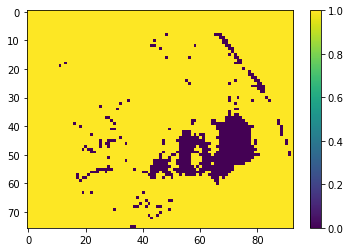

In [73]:
#Make sure all cancer tiles exist in the tissue mask
c_mask_filtered = np.logical_not(np.logical_not(c_mask) & np.logical_not(t_mask_filtered))

show_mask(c_mask_filtered)

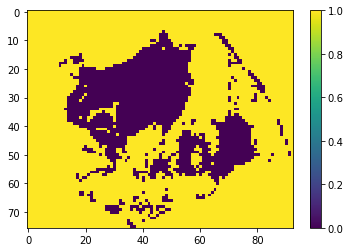

In [74]:
show_mask(t_mask_filtered)

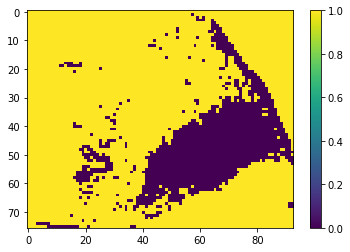

In [75]:
show_mask(c_mask)

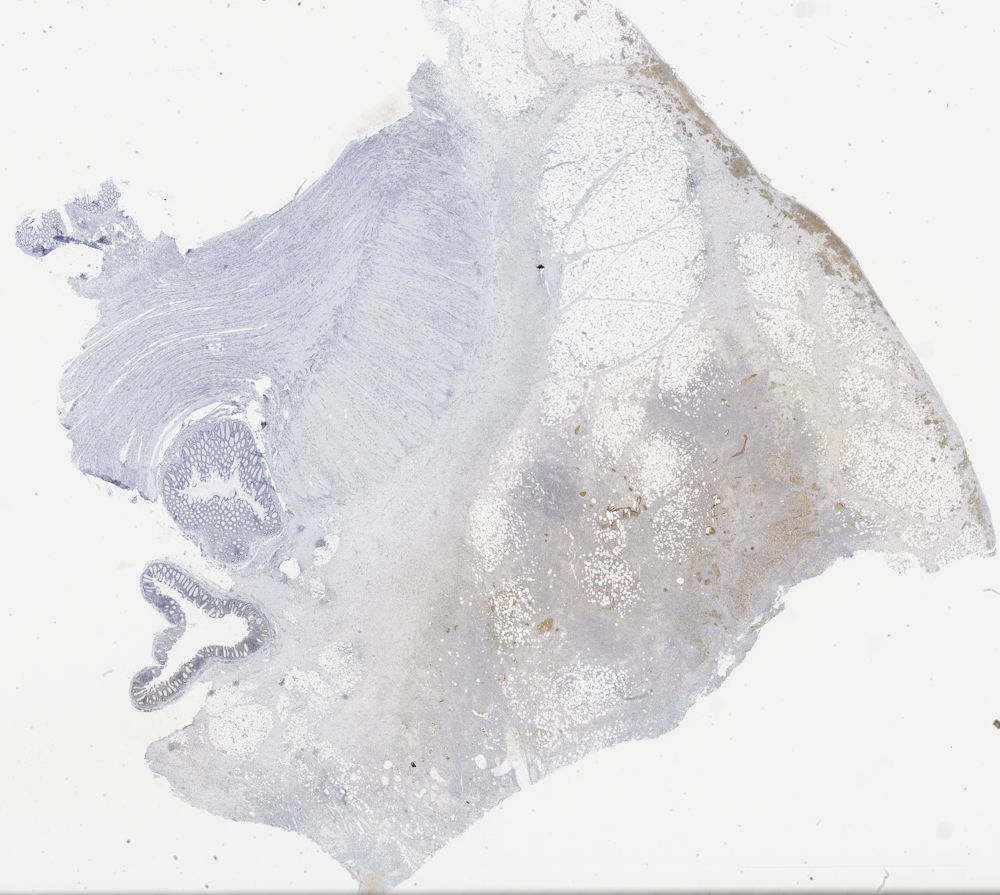

In [76]:
thumbnail(tp53)

In [77]:
overlay = plot_mask(tp53_filtered, u_mask_filtered.astype(np.uint8), tile_size)

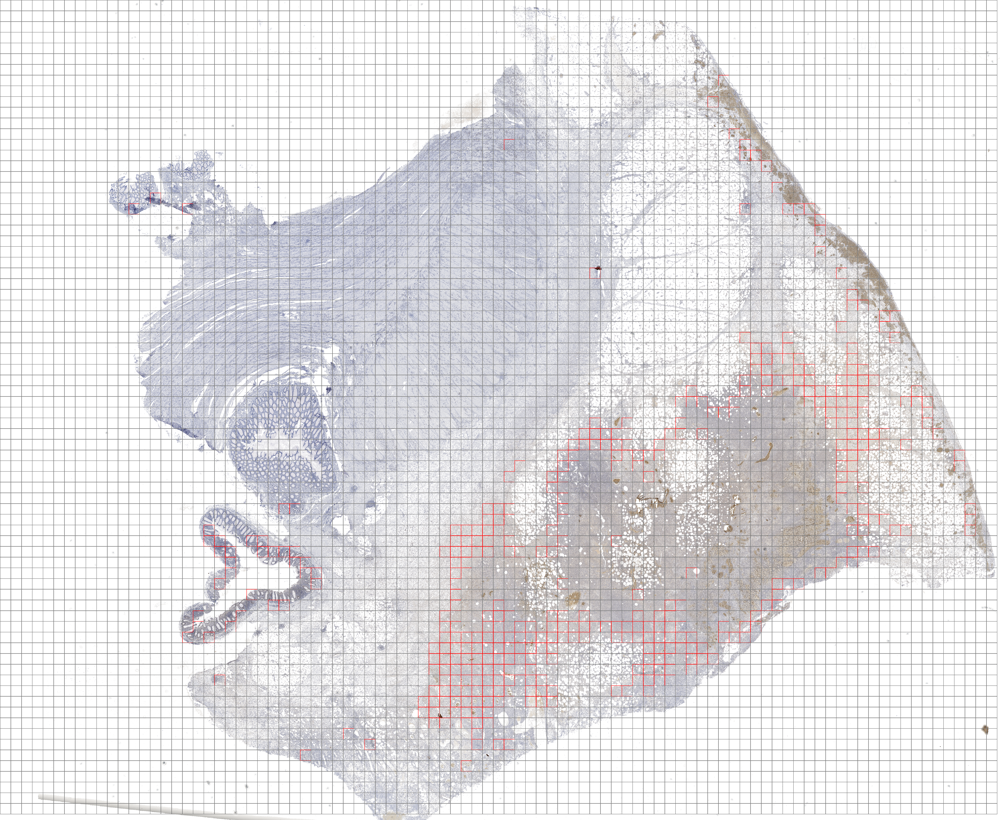

In [78]:
thumbnail(overlay)

In [79]:
overlay_tp53 = plot_masks(tp53_filtered, c_mask_filtered, t_mask_filtered, tile_size, u_mask_filtered, width_proportion = 0.07)
verbose_save_img(overlay_tp53.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'TP53_overlay.jpeg'), 'JPEG' )

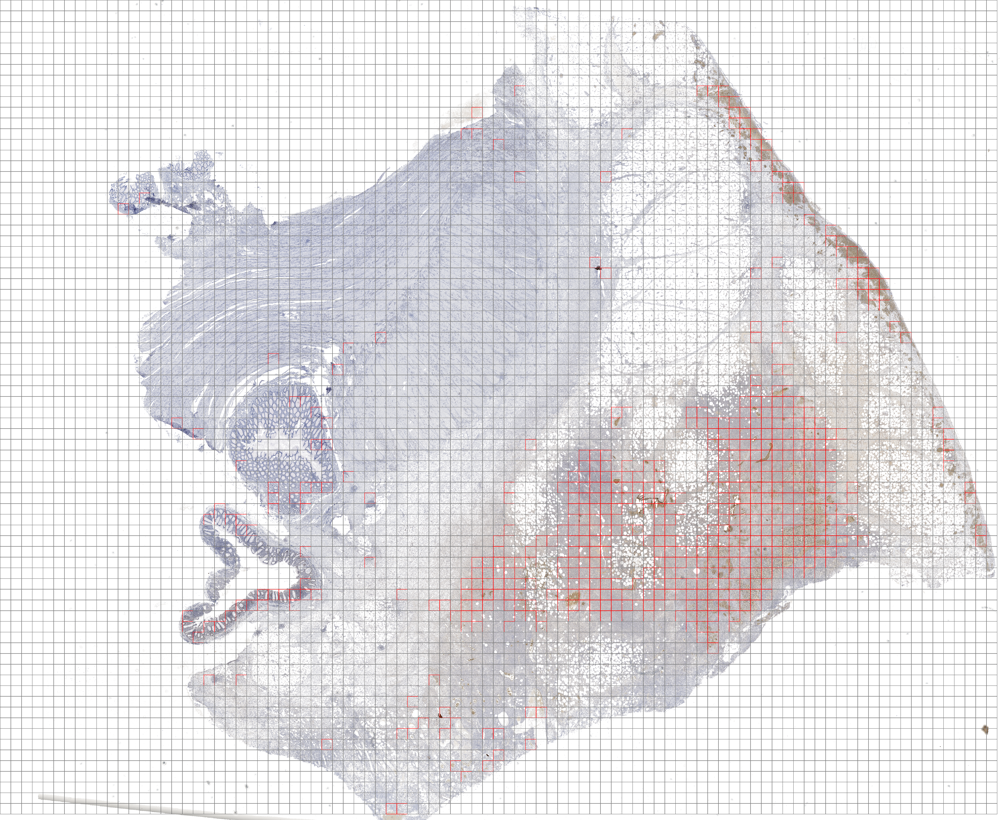

In [80]:
thumbnail(plot_mask(tp53_filtered, c_mask_filtered.astype(np.uint8), tile_size))

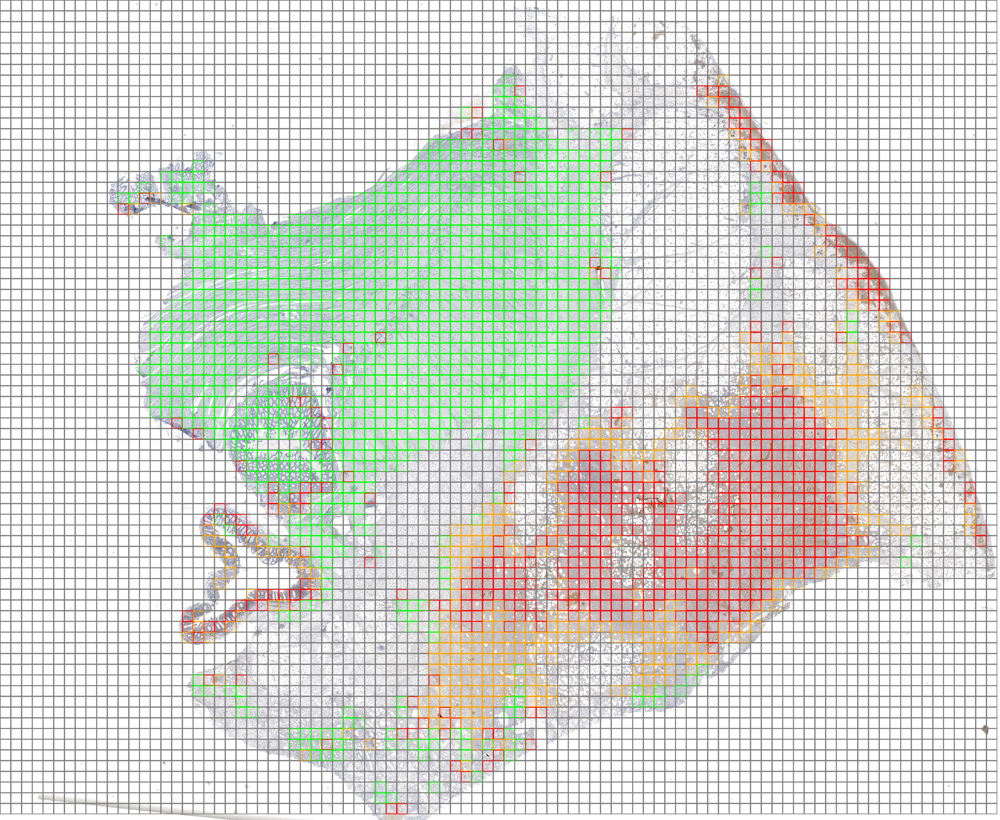

In [81]:
thumbnail(overlay_tp53)

In [82]:
overlay_he = plot_masks(he_filtered, c_mask_filtered, t_mask_filtered, tile_size, u_mask_filtered, width_proportion = 0.07)
verbose_save_img(overlay_he.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'HE_overlay.jpeg'), 'JPEG' )

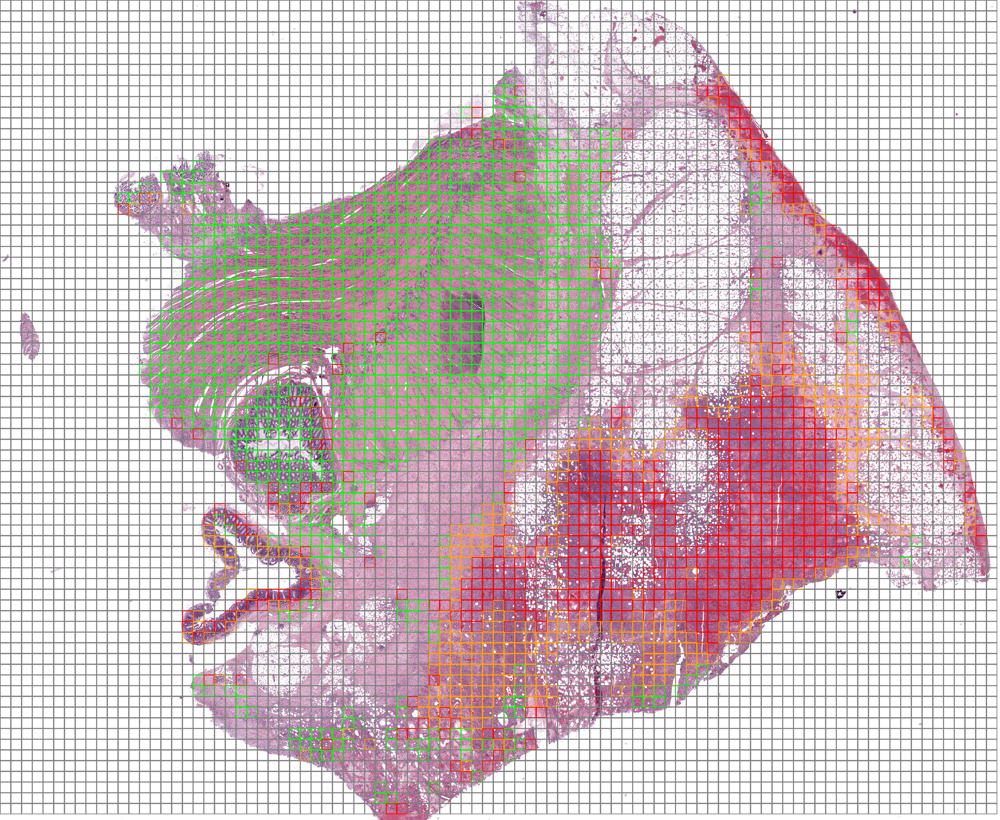

In [83]:
thumbnail(overlay_he)

In [84]:
##############
# Save Tiles #
##############

#Make Directory to save tiles
TILES_PATH = OUTPUT_PATH.joinpath('tiles_' + str(TILE_MAG) + 'x') 
os.makedirs(TILES_PATH, exist_ok = True)

In [85]:
def save_test_tiles(path, tile_gen, cancer_mask, tissue_mask, uncertain_mask, prefix = ''):
    os.makedirs(TILES_PATH.joinpath('cancer'), exist_ok = True)
    os.makedirs(TILES_PATH.joinpath('non-cancer'), exist_ok = True)
    os.makedirs(TILES_PATH.joinpath('uncertain'), exist_ok = True)
    os.makedirs(TILES_PATH.joinpath('other'), exist_ok = True)
    x_tiles, y_tiles = next(tile_gen)
    verbose_print('Whole Image Size is {0} x {1}'.format(x_tiles, y_tiles))
    i = 0 
    tile_counts = {'cancer': 0, 'non-cancer': 0, 'uncertain': 0, 'other': 0}
    for tile in tile_gen:
        img = tile.convert('RGB')
        ###
        img_norm = normaliser.transform_tile(img)
        ###
        #Name tile as horizontal position _ vertical position starting at (0,0)
        tile_name = prefix + str(np.floor_divide(i,x_tiles)) + '_' +  str(i%x_tiles) 
        if uncertain_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('uncertain', tile_name + '.jpeg'), 'JPEG')
            tile_counts['uncertain'] += 1
        elif cancer_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('cancer', tile_name + '.jpeg'), 'JPEG')
            tile_counts['cancer'] += 1
        elif tissue_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('non-cancer', tile_name + '.jpeg'), 'JPEG')
            tile_counts['non-cancer'] += 1
        else: 
            img_norm.save(path.joinpath('other', tile_name + '.jpeg'), 'JPEG')
            tile_counts['other'] += 1
        i += 1
    verbose_print('Exported tiles for {0}'.format(prefix))
    return tile_counts

In [86]:
# he_tile_mag = read_slide_at_mag(he_slide, TILE_MAG)
# he_std = LuminosityStandardizer.standardize(np.array(he_tile_mag))
# he_transformed = normaliser.transform(he_std)
# he_norm = Image.fromarray(he_transformed)
# thumbnail(he_norm)

In [87]:
tgen = tile_gen_at_mag(he_slide, TILE_MAG, 299)
tile_counts = save_test_tiles(TILES_PATH, tgen, c_mask_filtered, t_mask_filtered, u_mask_filtered, prefix = PREFIX)

Whole Image Size is 93 x 76
Exported tiles for 1792_T_9500_2_


In [88]:
tile_counts['slide_name'] = he_name

In [89]:
tile_counts_df = tile_counts_df.append(tile_counts, ignore_index = True)

In [92]:
tile_counts_df

,cancer,non-cancer,other,slide_name,uncertain
0,583.0,1158.0,4912.0,1792_T_9500_3_HandE.svs,415.0


In [91]:
tile_counts_df.to_csv(OUTPUT_PATH.joinpath('slide_tile_counts.csv'))

In [108]:
# tile_metrics = pd.DataFrame(np.array([[tissue_tiles, uncertain_tiles, cancer_tiles, uncertain_percentage, cancer_percentage]]), 
#                             index = [PREFIX],
#                              columns = ['tissue_tiles', 'uncertain_tiles', 'cancer_tiles', 'uncertain_percentage', 'cancer_percentage'])

In [109]:
# tile_metrics

,tissue_tiles,uncertain_tiles,cancer_tiles,uncertain_percentage,cancer_percentage
1794_T_9504_2_,1735.0,350.0,1021.0,0.201729,0.588473


In [110]:
# tile_metrics.to_csv(OUTPUT_PATH.joinpath(PREFIX + 'metrics.csv'))